### Laboratorium 6 - część 1/2

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [39]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from utils import *

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

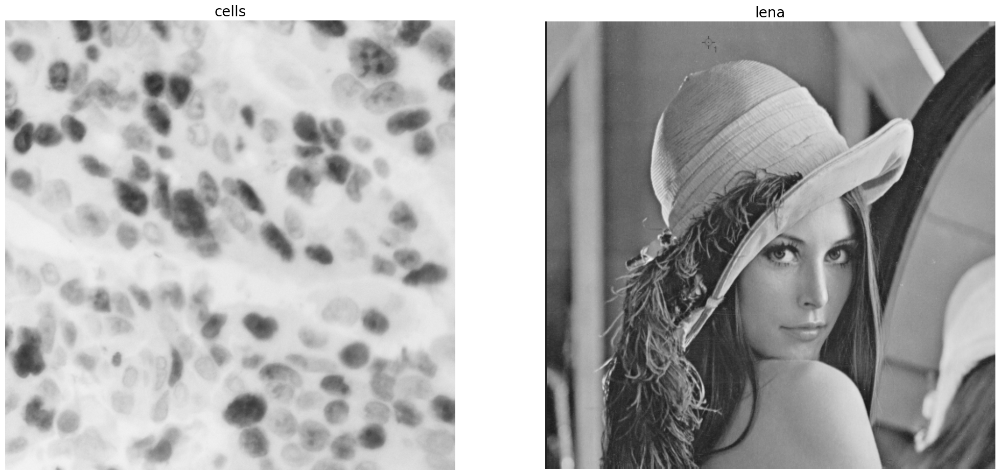

In [40]:
cells = cv2.imread('images/p17_0216_7.jpg')
cells = cv2.cvtColor(cells, cv2.COLOR_BGR2GRAY)
lena = cv2.imread('images/Lena.jpg')
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
display_images([cells, lena], titles=['cells', 'lena'])

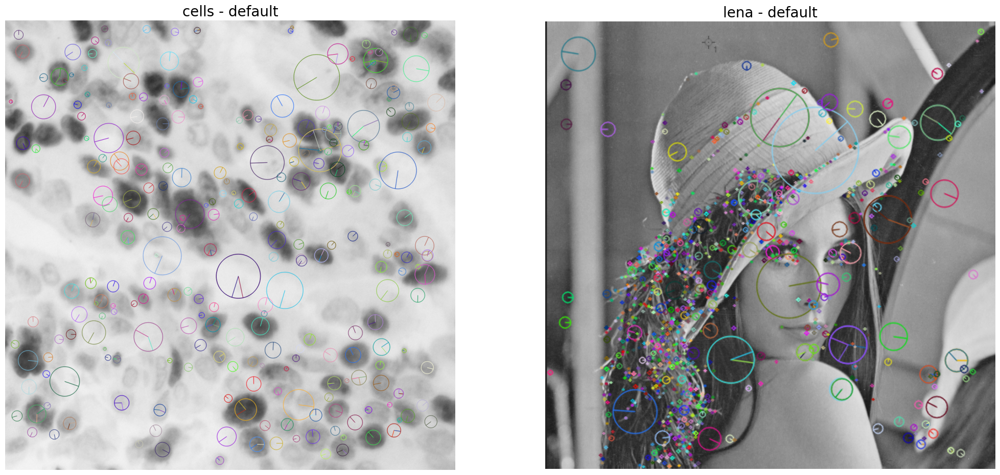

In [41]:
sift = cv2.SIFT_create()
keypoints, dsecriptors = sift.detectAndCompute(cells, None)
cells_with_keypoints = cv2.drawKeypoints(cells, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
keypoints, dsecriptors = sift.detectAndCompute(lena, None)
lena_with_keypoints = cv2.drawKeypoints(lena, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
display_images([cells_with_keypoints, lena_with_keypoints], titles=['cells - default', 'lena - default'])

In [42]:
contrast_thresholds = [0.003, 0.005, 0.007, 0.01, 0.02, 0.07]

Contrast threshold
0.001 detected 20179 keypoints
0.01 detected 1661 keypoints


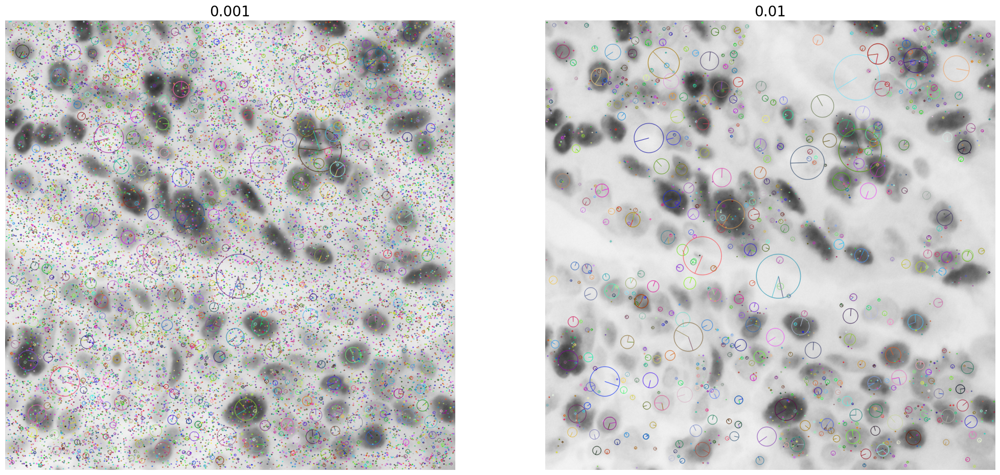

0.05 detected 187 keypoints
0.1 detected 67 keypoints


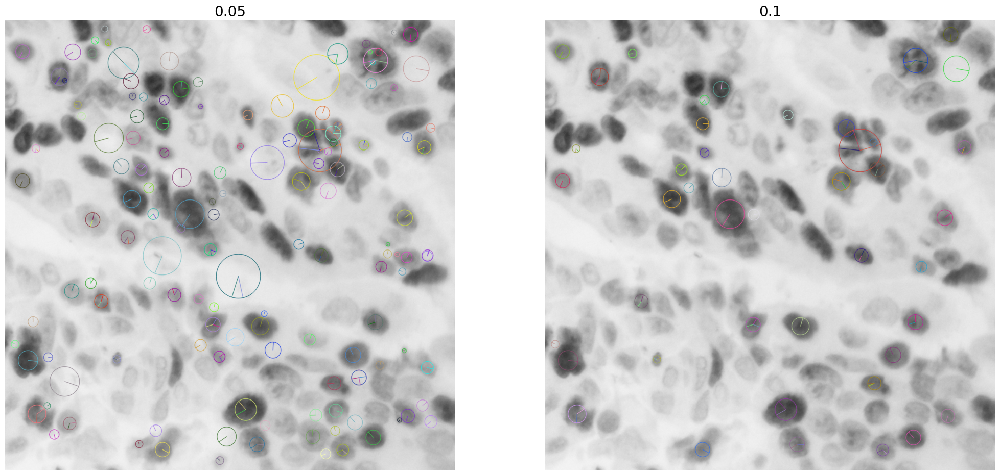

In [60]:
pair = {}
print("Contrast threshold")
for i, contrast_threshold in enumerate(contrast_thresholds):
    sift = cv2.SIFT_create(contrastThreshold=contrast_threshold, edgeThreshold=3)
    keypoints = sift.detect(cells)
    keypoints, descriptors = sift.compute(cells, keypoints)
    cells_with_keypoints = cv2.drawKeypoints(cells, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    pair[str(contrast_threshold)] = cells_with_keypoints
    print(contrast_threshold, 'detected', len(keypoints), 'keypoints')
    if len(pair) % 2 == 0:
        display_images(pair.values(), titles=list(pair.keys()))
        pair = {}

Edge threshold
0 detected 344 keypoints
1.5 detected 73 keypoints


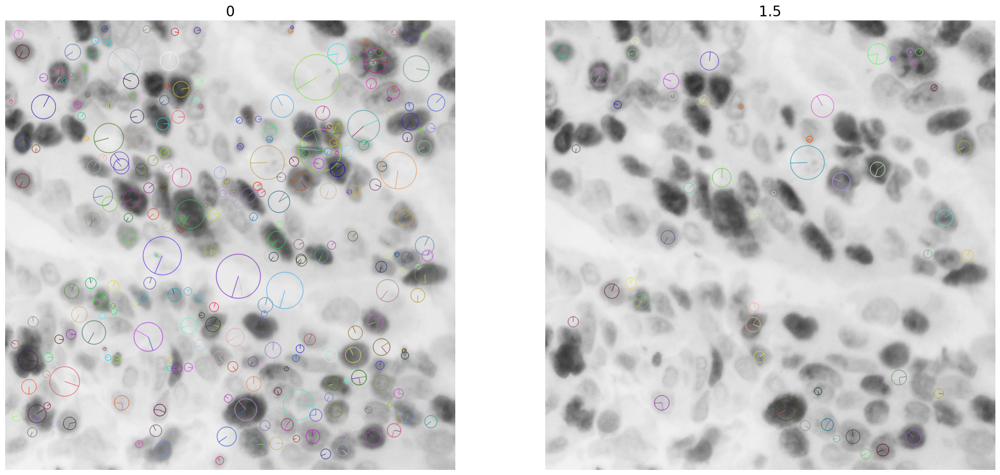

2 detected 166 keypoints
3 detected 229 keypoints


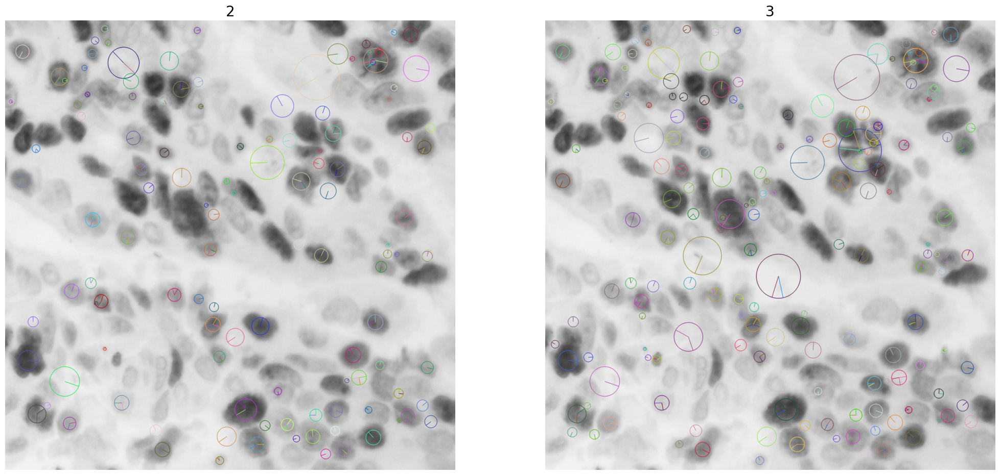

In [79]:
edge_thresholds = [0, 1.5, 2, 3]
pair = {}
print("Edge threshold")
for i, edge_threshold in enumerate(edge_thresholds):
    sift = cv2.SIFT_create(edgeThreshold=edge_threshold)
    keypoints = sift.detect(cells)
    keypoints, descriptors = sift.compute(cells, keypoints)
    cells_with_keypoints = cv2.drawKeypoints(cells, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    pair[str(edge_threshold)] = cells_with_keypoints
    print(edge_threshold, 'detected', len(keypoints), 'keypoints')
    if len(pair) % 2 == 0:
        display_images(pair.values(), titles=list(pair.keys()))
        pair = {}

## LENA

In [45]:
contrast_thresholds = [0.001, 0.01, 0.05, 0.1]

Contrast threshold
0.001 detected 2694 keypoints
0.01 detected 2116 keypoints


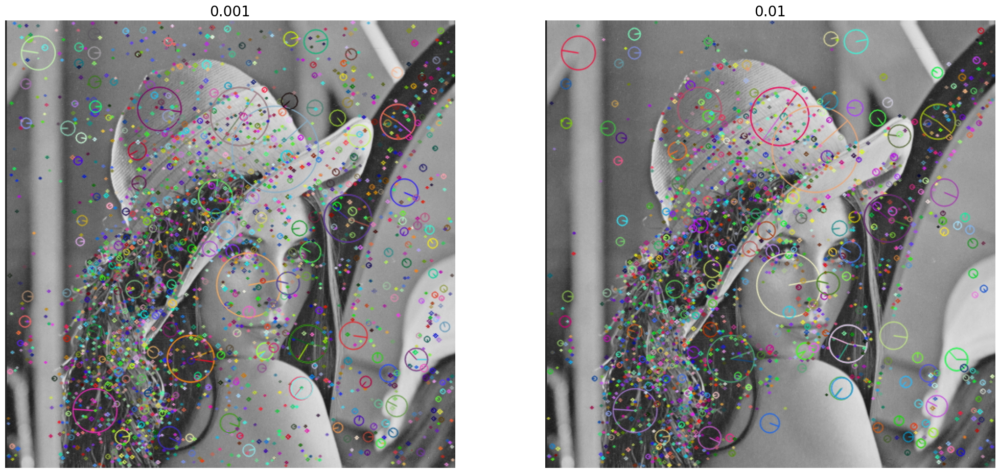

0.05 detected 924 keypoints
0.1 detected 260 keypoints


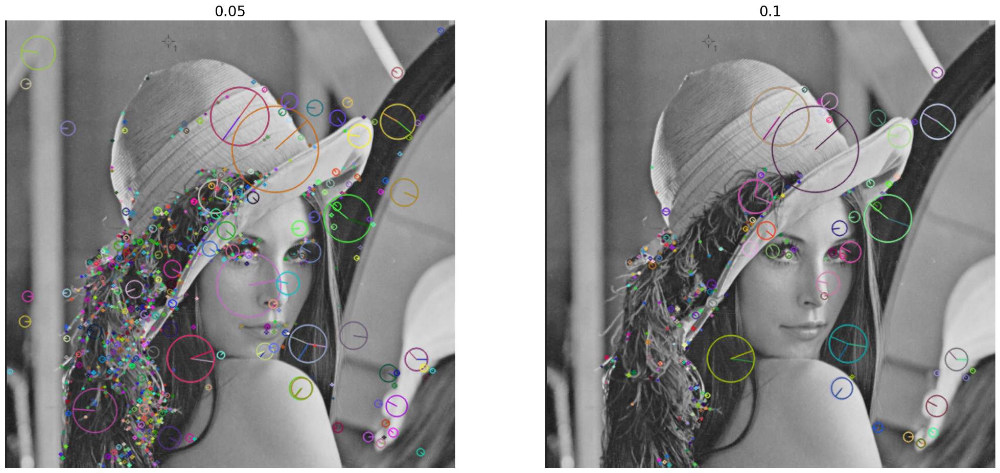

In [46]:
pair = {}
print("Contrast threshold")
for i, contrast_threshold in enumerate(contrast_thresholds):
    sift = cv2.SIFT_create(contrastThreshold=contrast_threshold, edgeThreshold=10)
    keypoints = sift.detect(lena)
    keypoints, descriptors = sift.compute(lena, keypoints)
    lena_with_keypoints = cv2.drawKeypoints(lena, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    pair[str(contrast_threshold)] = lena_with_keypoints
    print(contrast_threshold, 'detected', len(keypoints), 'keypoints')
    if len(pair) % 2 == 0:
        display_images(pair.values(), titles=list(pair.keys()))
        pair = {}

In [47]:
edge_thresholds = [0, 1, 2, 3]

Edge threshold
0 detected 516 keypoints
1 detected 0 keypoints


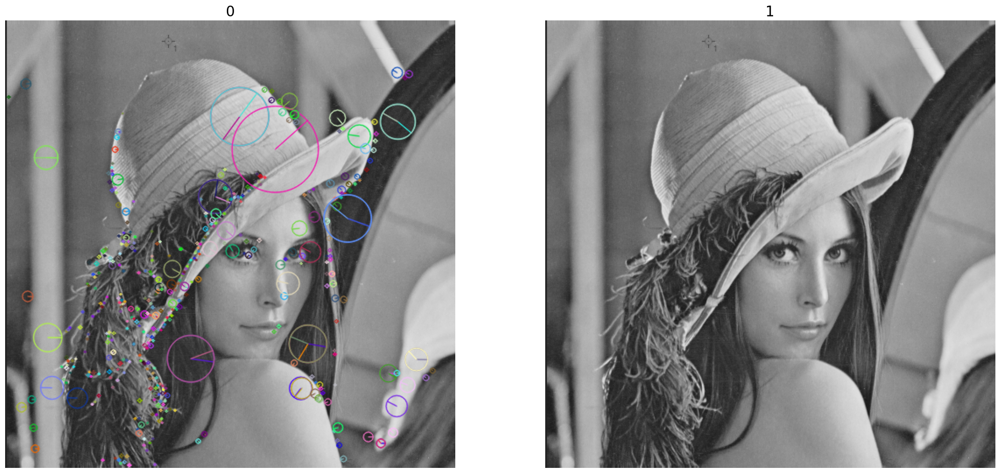

2 detected 56 keypoints
3 detected 125 keypoints


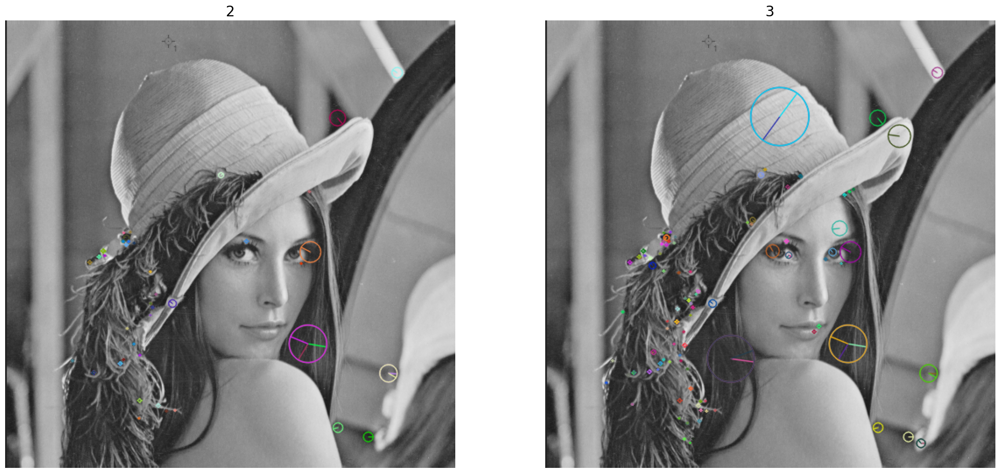

In [48]:
pair = {}
print("Edge threshold")
for i, edge_threshold in enumerate(edge_thresholds):
    sift = cv2.SIFT_create(contrastThreshold=0.09, edgeThreshold=edge_threshold)
    keypoints = sift.detect(lena)
    keypoints, descriptors = sift.compute(lena, keypoints)
    lena_with_keypoints = cv2.drawKeypoints(lena, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    pair[str(edge_threshold)] = lena_with_keypoints
    print(edge_threshold, 'detected', len(keypoints), 'keypoints')
    if len(pair) % 2 == 0:
        display_images(pair.values(), titles=list(pair.keys()))
        pair = {}

#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, oceniając wizualnie stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`.

In [49]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

In [69]:
def scale(image, scale):
    # return center of image 
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, 0, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

In [80]:
def plot_cords(cords1, cords2, title=None):
    plt.figure(figsize=(10, 10))
    plt.scatter(cords1[:, 0]+500, cords1[:, 1], c='r', label='original')
    plt.scatter(cords2[:, 0], cords2[:, 1], c='b', label='rotated')
    plt.xlim(-200, max(cords1[:, 0].max(), cords2[:, 0].max())+200)
    plt.ylim(-200, max(cords1[:, 1].max(), cords2[:, 1].max())+200)
    plt.title(f'SIFT keypoints, before and after rotation {title}')
    plt.xlabel('width')
    plt.ylabel('height')
    plt.legend()
    plt.show()

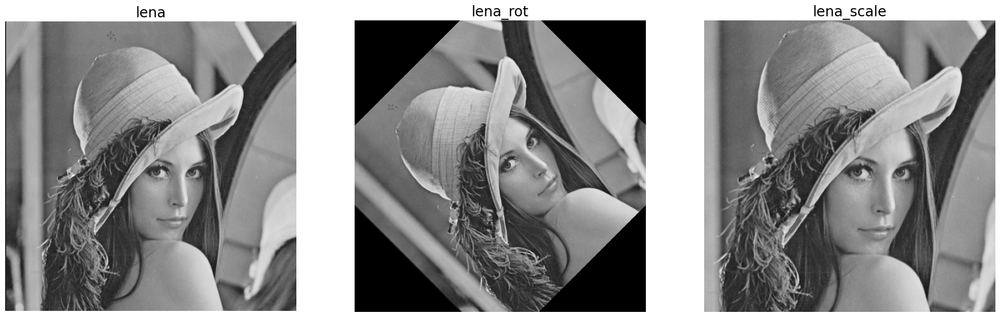

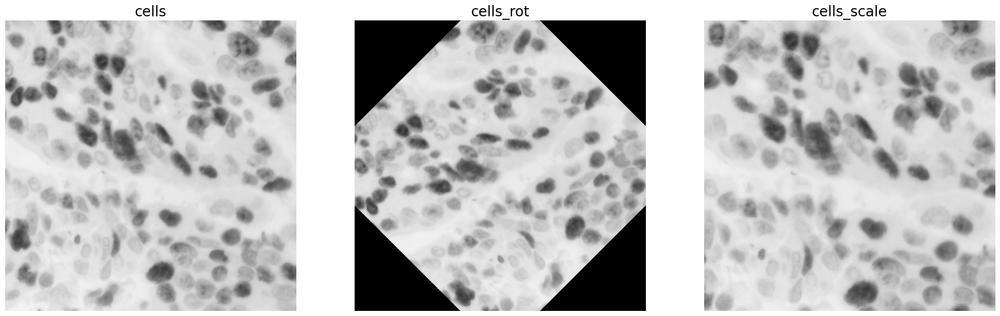

In [81]:
lena_rot = rotate(lena, 45.0, scale=0.9)
cells_rot = rotate(cells, 45.0, scale=0.9)
lena_scale = scale(lena, 1.2)
cells_scale = scale(cells, 1.2)
display_images([lena, lena_rot, lena_scale], titles=['lena', 'lena_rot', 'lena_scale'])
display_images([cells, cells_rot, cells_scale], titles=['cells', 'cells_rot', 'cells_scale'])

In [82]:
cords_og, cords_rot = [], []

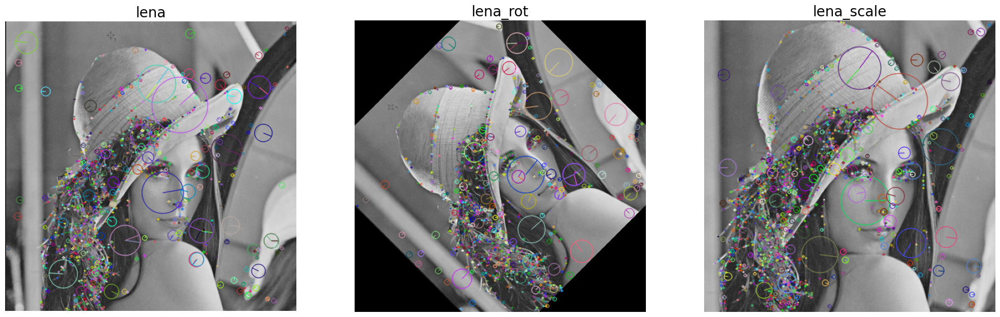

In [83]:
sift = cv2.SIFT_create()

keypoints, dsecriptors = sift.detectAndCompute(lena, None)
lena_with_keypoints = cv2.drawKeypoints(lena, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cords_og = np.array([keypoint.pt for keypoint in keypoints])

keypoints, dsecriptors = sift.detectAndCompute(lena_rot, None)
lena_rot_with_keypoints = cv2.drawKeypoints(lena_rot, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cords_rot = np.array([keypoint.pt for keypoint in keypoints])

keypoints, dsecriptors = sift.detectAndCompute(lena_scale, None)
lena_scale_with_keypoints = cv2.drawKeypoints(lena_scale, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cords_scale = np.array([keypoint.pt for keypoint in keypoints])

display_images([lena_with_keypoints, lena_rot_with_keypoints, lena_scale_with_keypoints], titles=['lena', 'lena_rot', 'lena_scale'])

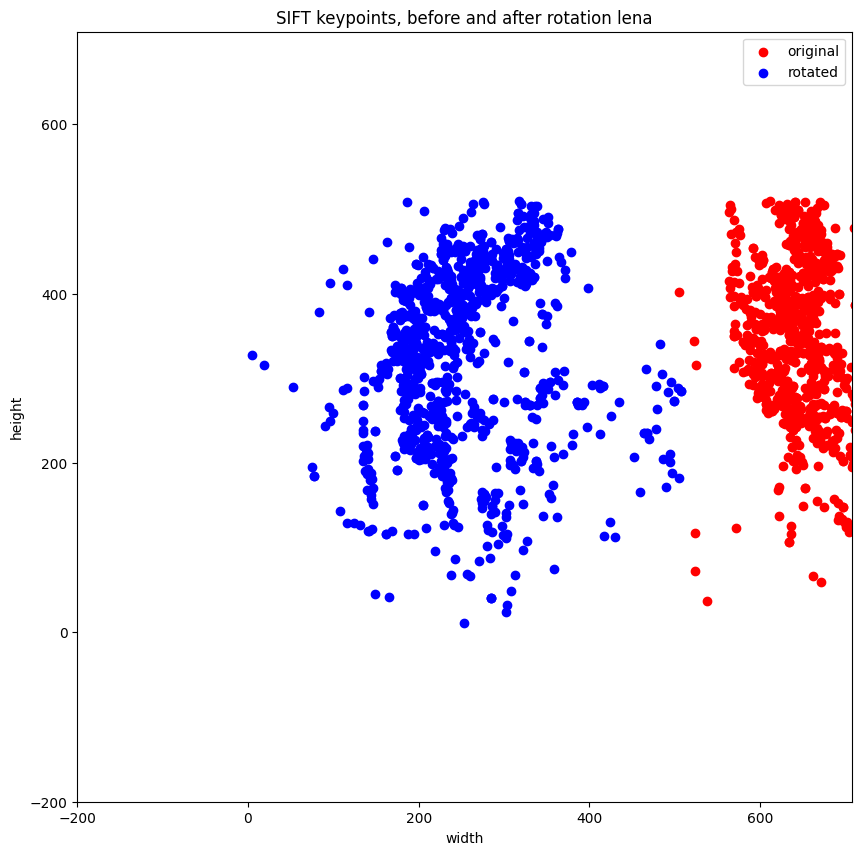

In [84]:
plot_cords(cords_og, cords_rot, title='lena')

In [55]:
cords_og, cords_rot = [], []

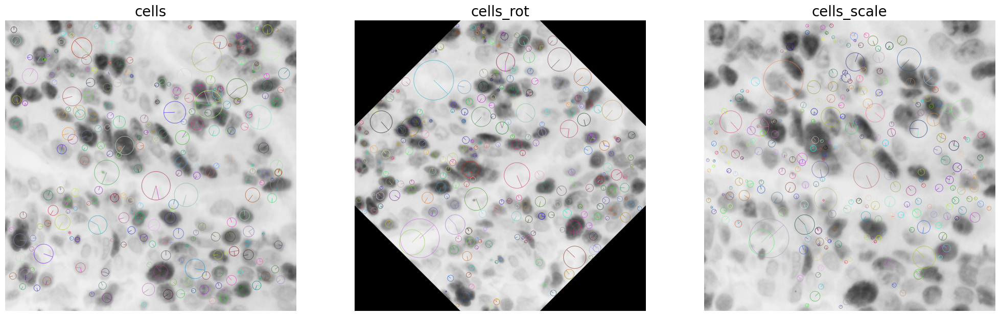

In [78]:
sift = cv2.SIFT_create()

keypoints, dsecriptors = sift.detectAndCompute(cells, None)
cords_og = np.array([keypoint.pt for keypoint in keypoints])
cells_with_keypoints = cv2.drawKeypoints(cells, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints, dsecriptors = sift.detectAndCompute(cells_rot, None)
cords_rot = np.array([keypoint.pt for keypoint in keypoints])
cells_rot_with_keypoints = cv2.drawKeypoints(cells_rot, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoint, dsecriptors = sift.detectAndCompute(cells_scale, None)
cells_scale_with_keypoints = cv2.drawKeypoints(cells_scale, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

display_images([cells_with_keypoints, cells_rot_with_keypoints, cells_scale_with_keypoints], titles=['cells', 'cells_rot', 'cells_scale'])

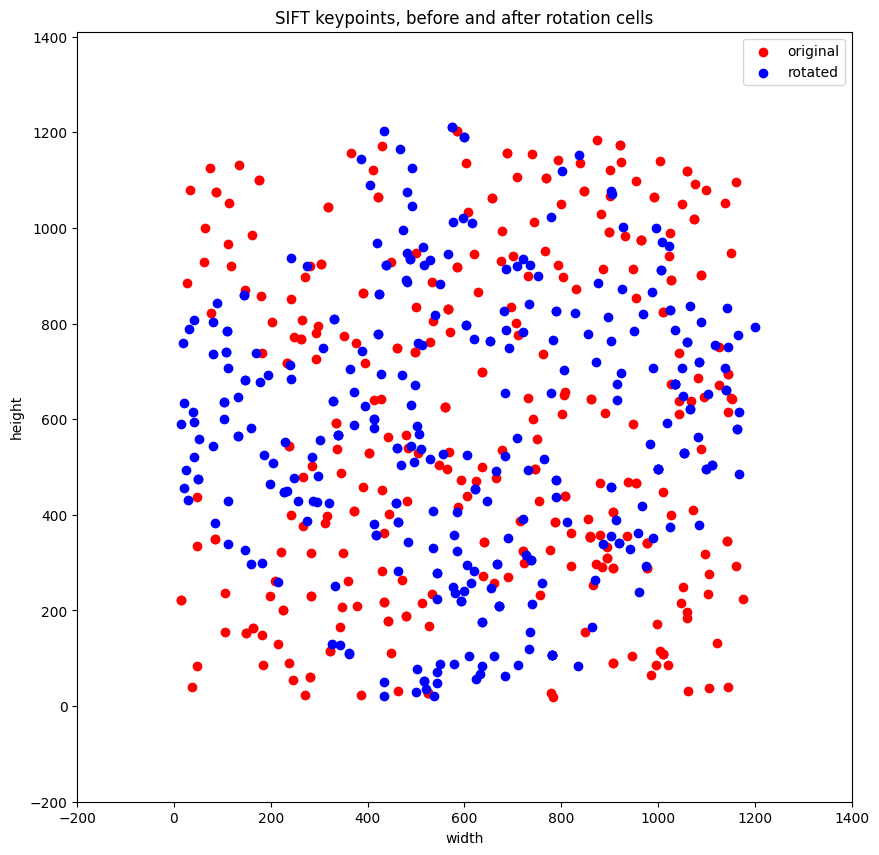

In [57]:
plot_cords(cords_og, cords_rot, title='cells')